In [1]:
import sys
from os.path import join, abspath, pardir
from glob import glob
import numpy as np
import pandas as pd
import vaex
from tqdm import tqdm
import matplotlib.pyplot as plt
import os
from time import time
from multiprocessing import Pool
import emcee
import corner
from scipy.stats import norm, uniform
import affine_invariant as af

In [2]:
root_dir = abspath(pardir)
if root_dir not in sys.path:
    sys.path.append(root_dir)
sys.path

['/home2/s20321005/Thesis-Project/4_Gravity',
 '/home2/s20321005/.conda/envs/vaex/lib/python38.zip',
 '/home2/s20321005/.conda/envs/vaex/lib/python3.8',
 '/home2/s20321005/.conda/envs/vaex/lib/python3.8/lib-dynload',
 '',
 '/home2/s20321005/.local/lib/python3.8/site-packages',
 '/home2/s20321005/.conda/envs/vaex/lib/python3.8/site-packages',
 '/home2/s20321005/Thesis-Project']

In [3]:
plt.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark',
 'seaborn-dark-palette',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'seaborn-white',
 'seaborn-whitegrid',
 'tableau-colorblind10']

In [5]:
dpi = 300
from utils import style
style("seaborn-deep", False)

In [6]:
root_data_dir = abspath(join(root_dir, "Data"))
data_dir = join(root_data_dir, "MCMC-rust")
data_baryon_dir = join(root_data_dir, "Baryon")
data_velocity_dir = join(root_data_dir, "Velocity-Distribution-2")
data_eff_dir = join(root_data_dir, "Effective-Volume-2")

In [7]:
# load baryons components
df_baryon = vaex.open(join(data_baryon_dir, "baryon.hdf5"))
rhos = df_baryon["rho"].to_numpy()  # Msun/pc^3
sigmaz = df_baryon["sigma_z"].to_numpy() # km/s
e_rhos = df_baryon["e_rho"].to_numpy()  # Msun/pc^3
e_sigmaz = df_baryon["e_sigma_z"].to_numpy() # km/s

In [8]:
# load data from files
number_files = glob(join(data_eff_dir, "*.hdf5"))
number_files.sort()
velocity_files = glob(join(data_velocity_dir, "gaia_*.hdf5"))
velocity_files.sort()
velocity_popt_files = glob(join(data_velocity_dir, "popt_gaia_*.hdf5"))
velocity_popt_files.sort()

In [9]:
from utils import (log_prior, log_likelihood_dm, load_data, plot_data, plot_corner,
                    run_mcmc)

gaia_(0.04)_(0.10).hdf5


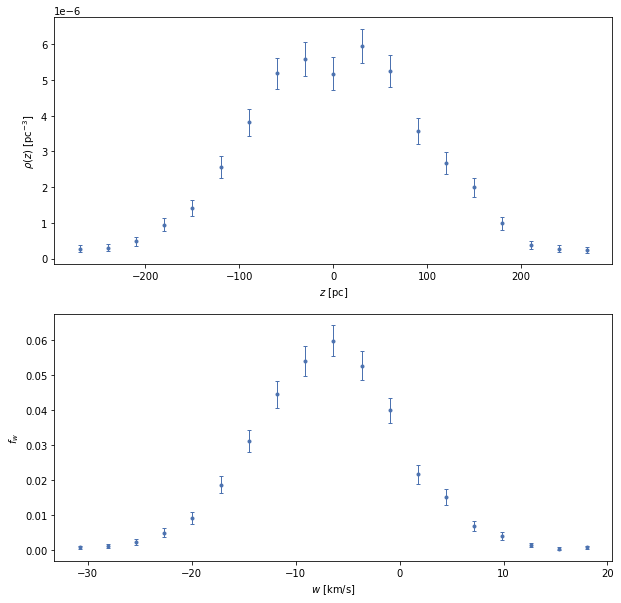

In [53]:
index = 1
data, dim, w0, sigma_w, a_raw, name = load_data(index, number_files, velocity_files, velocity_popt_files)
print(name)
## plot data
plot_data(data)

In [54]:
w0

array([-6.38133606])

In [55]:
(np.log(1E-6), np.log(10E-6)), (np.log(0.02), np.log(0.13))

((-13.815510557964274, -11.512925464970229),
 (-3.912023005428146, -2.0402208285265546))

In [56]:
zdata, wdata = data

In [57]:
locs = dict(
    rhoDM=-0.02,
    log_nu0=-14,
    R=3.4E-3,
    zsun=-20,
    w0=-10,
    sigmaw=2,
    log_a=-3
)

scales = dict(
    rhoDM=0.1,
    log_nu0=5,
    R=0.6E-3,
    zsun=40,
    w0=5,
    sigmaw=10,
    log_a=4
)

locs = np.array(list(locs.values()))
scales = np.array(list(scales.values()))

In [58]:
ndim = 31
nwalkers = 2*ndim+2

In [59]:
p0 = af.generate_p0_dm1(nwalkers, locs, scales)
p0.shape

(64, 31)

In [60]:
t0 = time()
sampler = af.mcmc_dm1(500, nwalkers, p0, zdata, wdata, locs, scales, dz=10, verbose=True)
print(time() - t0, "s")

38.525670766830444 s


In [61]:
# plot first 500 steps
rhob = sampler[:, :, :12].sum(axis=2)
sigmaz = sampler[:, :, 12:24].sum(axis=2)
rhoDM = sampler[:, :, 24]
nu0 = sampler[:, :, 25]
R = sampler[:, :, 26]
zsun = sampler[:, :, 27]
w0 = sampler[:, :, 28]
sigmaw = sampler[:, :, 29]
a = sampler[:, :, 30]

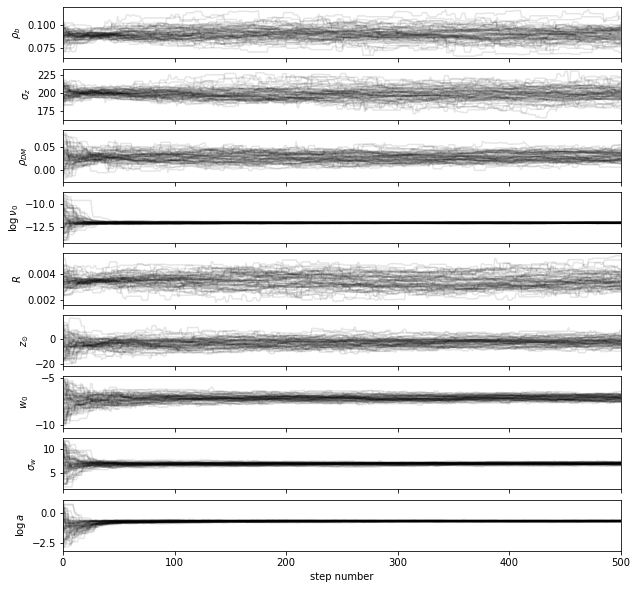

In [62]:
chain = np.array([rhob, sigmaz, rhoDM, nu0, R, zsun, w0, sigmaw, a])
# # chain.shape
labels = [r'$\rho_b$', r'$\sigma_z$', r'$\rho_{DM}$', r'$\log \nu_0$', r'$R$', r'$z_{\odot}$', r'$w_0$', r'$\sigma_w$', r'$\log a$']
fig, axes = plt.subplots(9, 1, figsize=(10, 10), sharex=True)
for i in range(9):
    axes[i].plot(chain[i], color="k", alpha=0.1)
    axes[i].set_xlim(0, len(sampler)-1)
    axes[i].set_ylabel(labels[i])
axes[-1].set_xlabel("step number")
plt.savefig('chain-0.png', dpi=70)
plt.show()

In [63]:
p0_next = sampler[-1]
t0 = time()
sampler = af.mcmc_dm1(2000, nwalkers, p0_next, zdata, wdata, locs, scales, dz=10, verbose=True)
print(time() - t0, "s")

152.66813945770264 s


In [65]:
# plot first 500 steps
rhob = sampler[:, :, :12].sum(axis=2)
sigmaz = sampler[:, :, 12:24].sum(axis=2)
rhoDM = sampler[:, :, 24]
nu0 = sampler[:, :, 25]
R = sampler[:, :, 26]
zsun = sampler[:, :, 27]
w0 = sampler[:, :, 28]
sigmaw = sampler[:, :, 29]
a = sampler[:, :, 30]

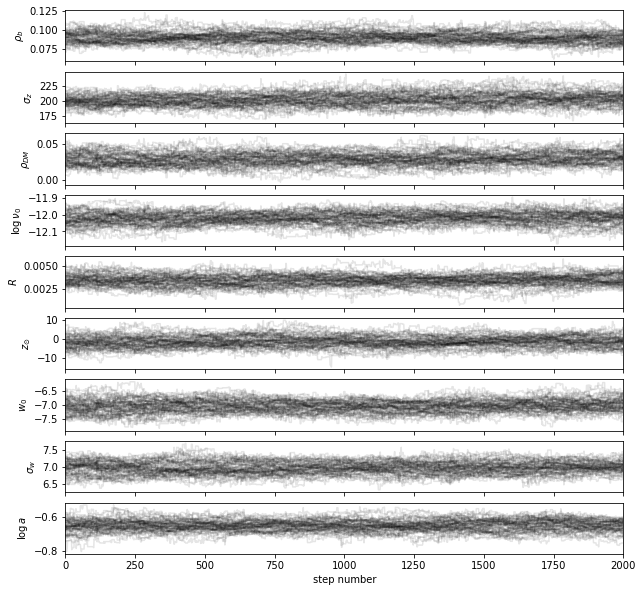

In [66]:
chain = np.array([rhob, sigmaz, rhoDM, nu0, R, zsun, w0, sigmaw, a])
# # chain.shape
labels = [r'$\rho_b$', r'$\sigma_z$', r'$\rho_{DM}$', r'$\log \nu_0$', r'$R$', r'$z_{\odot}$', r'$w_0$', r'$\sigma_w$', r'$\log a$']
fig, axes = plt.subplots(9, 1, figsize=(10, 10), sharex=True)
for i in range(9):
    axes[i].plot(chain[i], color="k", alpha=0.1)
    axes[i].set_xlim(0, len(sampler)-1)
    axes[i].set_ylabel(labels[i])
axes[-1].set_xlabel("step number")
# plt.savefig('chain-0.png', dpi=70)
plt.show()

In [67]:
rhob_f = rhob.reshape(-1)/1E-2
sigmaz_f = sigmaz.reshape(-1)
rhoDM_f = rhoDM.reshape(-1)/1E-2
nu0_f = nu0.reshape(-1)
R_f = R.reshape(-1)/1E-3
zsun_f = zsun.reshape(-1)
w0_f = w0.reshape(-1)
sigmaw_f = sigmaw.reshape(-1)
a_f = a.reshape(-1)

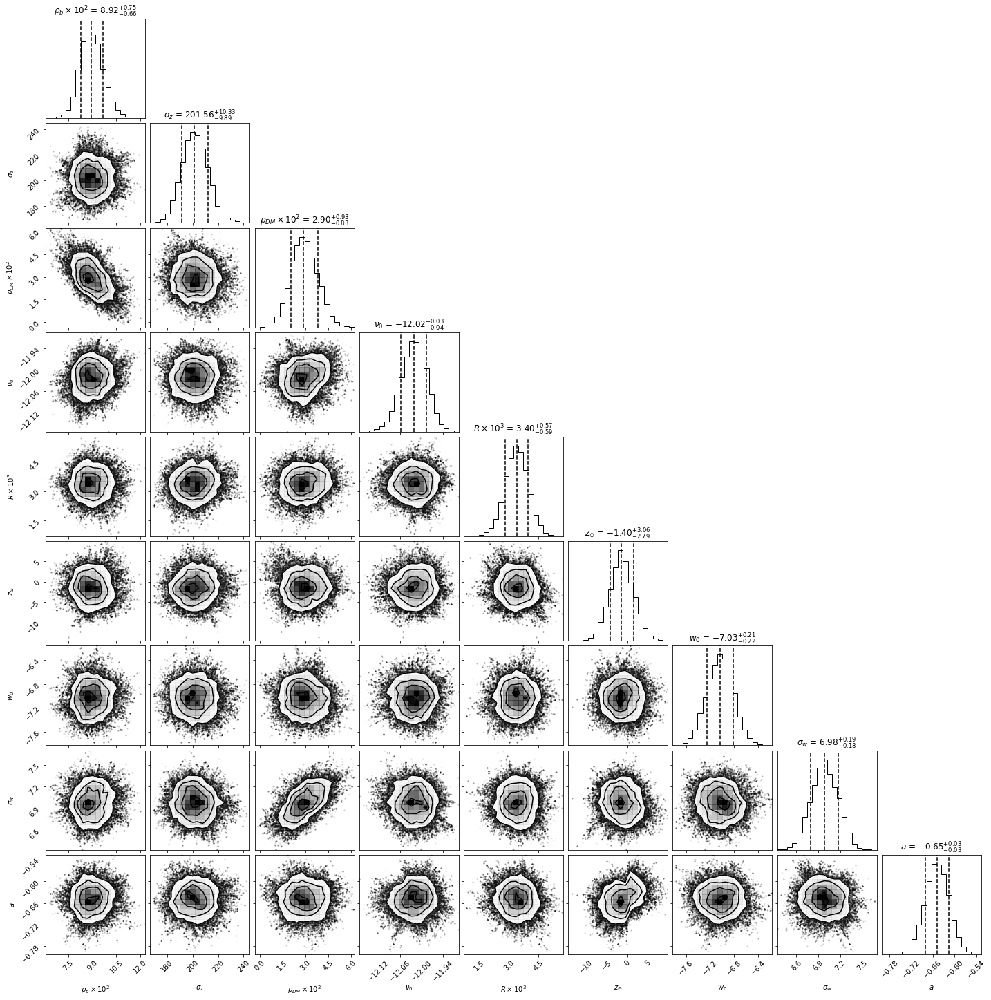

In [68]:
flat_samples = np.array([rhob_f, sigmaz_f, rhoDM_f, nu0_f, R_f, zsun_f, w0_f, sigmaw_f, a_f])
labels = [r'$\rho_b\times 10^2$', r'$\sigma_z$', r'$\rho_{DM}\times 10^2$', r'$\nu_0$', r'$R\times 10^3$', r'$z_{\odot}$', r'$w_0$', r'$\sigma_w$', r'$a$']

fig = corner.corner(
    flat_samples.T, labels=labels, quantiles=[0.16, 0.5, 0.84], show_titles=True, title_kwargs={"fontsize": 12}
)
# fig.savefig("corner.png", dpi=70)
plt.show()

In [48]:
zmid, znum, zerr = zdata
wmid, wnum, werr = wdata
dz = zmid[1] - zmid[0]
dw = wmid[1] - wmid[0]

fitting....


100%|██████████| 1000/1000 [00:01<00:00, 514.27it/s]


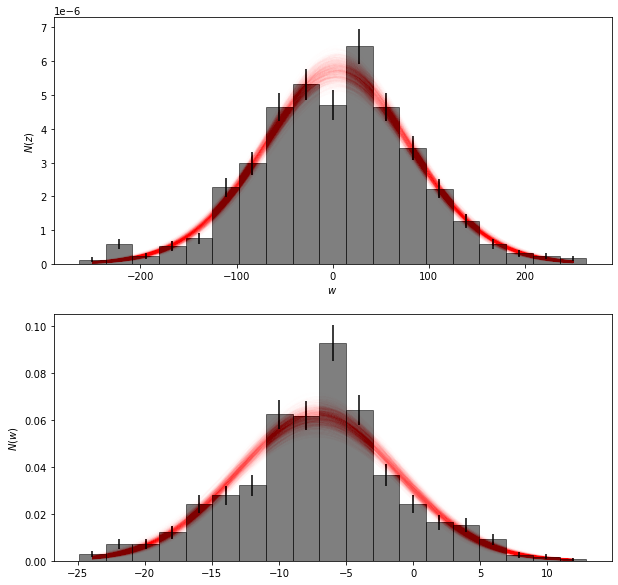

In [50]:
zs = np.linspace(zmid.min(), zmid.max(), 100)
ws = np.linspace(wmid.min(), wmid.max(), 100)

flat_samples = sampler.reshape((-1, ndim))
fig, axes = plt.subplots(2, 1, figsize=(10, 10))
axes[0].bar(zmid, znum, yerr=zerr, width=dz, color='k', alpha=0.5, ec='k')
axes[0].set_ylabel(r'$N(z)$')
axes[0].set_xlabel(r'$z$')
axes[1].bar(wmid, wnum, yerr=werr, width=dw, color='k', alpha=0.5, ec="k")
axes[1].set_ylabel(r'$N(w)$')
axes[0].set_xlabel(r'$w$')
print("fitting....")
for i in tqdm(range(1000)): 
    ind = np.random.randint(len(flat_samples))
    theta = flat_samples[ind]
    fz_mod = af.fz1(zs, theta)
    fw_mod = af.fw1(ws, theta)
    axes[0].plot(zs, fz_mod, color='r', alpha=0.005)
    axes[1].plot(ws, fw_mod, color='r', alpha=0.005)
# plt.savefig('fit.png', dpi=70)
plt.show()

# DM halo only

In [9]:
from utils import (initialize_prior_dm, log_posterior_dm,
                   initialize_walkers_dm, run_mcmc,
                   plot_fitting_dm, consume_samples_dm,
                   get_dataframe_dm)

In [10]:
## initialize prior
simple = True
cores = 16
locs, scales, uni_list_DM, norm_list_DM = initialize_prior_dm(dim, w0, sigma_w, a_raw, simple=simple)
locs, scales, uni_list_DM, norm_list_DM

({'rhoDM': -0.05,
  'log_nu0': -13.815510557964274,
  'zsun': -40,
  'R': 0.0034,
  'w0': array([-26.7145192 , -26.70622469]),
  'log_sigma_w': array([2.35840538, 1.71660979]),
  'a': array([0.37196607, 0.32629411])},
 {'rhoDM': 0.15000000000000002,
  'log_nu0': 4.605170185988092,
  'zsun': 80,
  'R': 0.0006,
  'w0': array([40, 40]),
  'log_sigma_w': array([0.61903921, 0.61903921]),
  'a': array([0.31882806, 0.27968066])},
 ['rhoDM', 'log_nu0', 'zsun', 'log_sigma_w', 'w0', 'a'],
 ['R'])

In [11]:
## initialize walkers
p0, ndim, nwalkers = initialize_walkers_dm(locs, scales, dim, simple=simple)
p0.shape, ndim, nwalkers

((21, 10), 10, 21)

In [12]:
uni_list_DM, norm_list_DM

(['rhoDM', 'log_nu0', 'zsun', 'log_sigma_w', 'w0', 'a'], ['R'])

In [13]:
for p00 in p0:
    print(log_posterior_dm(p00, data, locs, scales, dim, norm_list_DM, uni_list_DM, simple=simple))

-2102.500776481664
-12194.746924431558
-5500.363992086002
-6647.954714083926
-3295.1669784605892
-2502.477234676078
-78.05287043903586
-5547.302446543471
-4566.163331872477
-1431.8889663296254
-2777.466254105804
-52178.610282753914
-7620.201312088308
-2587.1905204719355
-3732.19238040418
-3968.258377230899
-4622.223797426969
-4401.837341892541
-8162.419929902561
-5770.7288683078505
-2289.7026836201476


100%|██████████| 500/500 [00:43<00:00, 11.57it/s]


Multiprocessing took 43.4 seconds


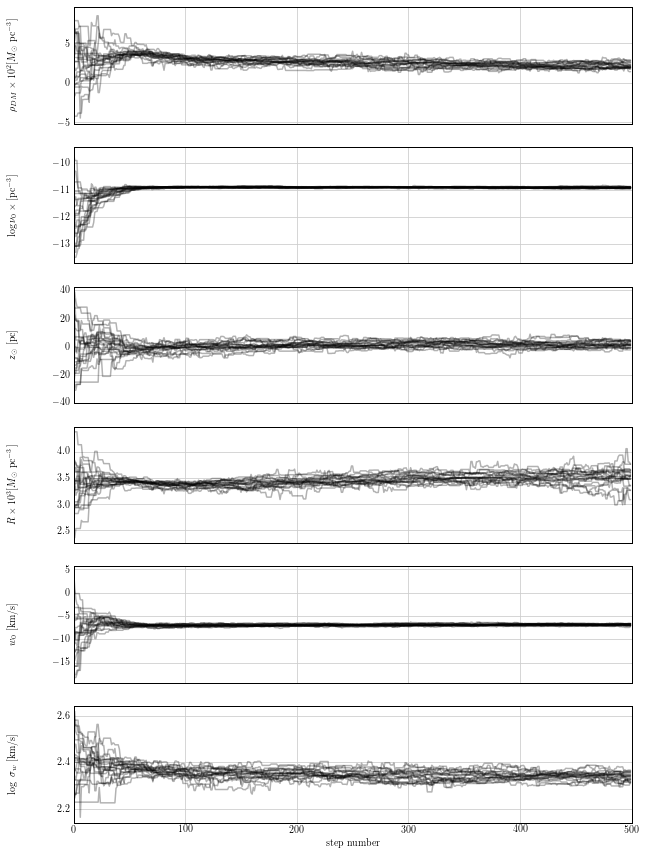

In [14]:
sampler = run_mcmc(
    nwalkers, ndim, p0, dim, log_posterior_dm, consume_samples_dm, cores=cores,
    args=[data, locs, scales, dim, norm_list_DM, uni_list_DM, simple], 
    plot=True, step=500, simple=simple
)

100%|██████████| 2000/2000 [02:50<00:00, 11.75it/s]


Multiprocessing took 170.3 seconds


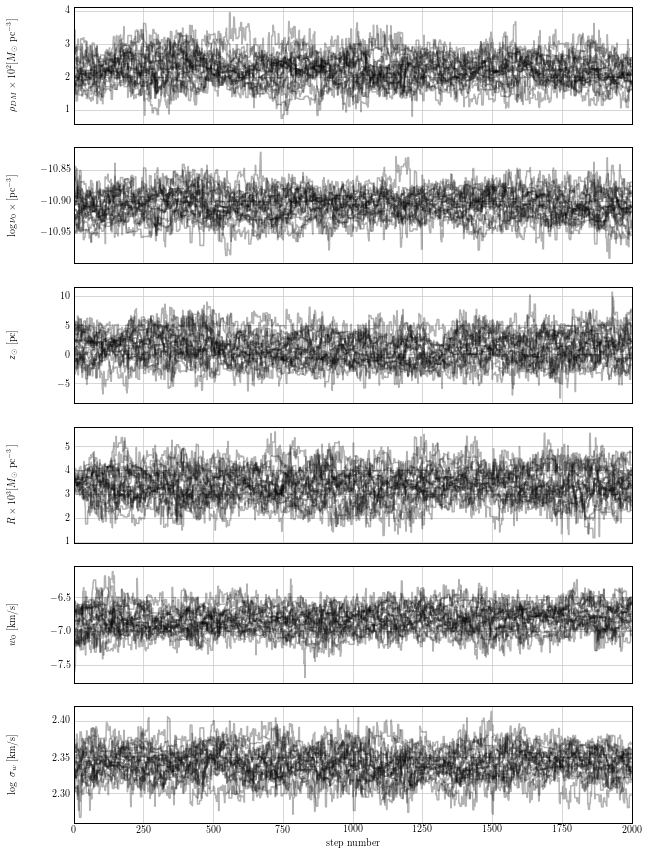

In [15]:
## run again, with the last sample as the initial point
next_p0 = sampler.get_chain()[-1]
sampler_new = run_mcmc(
    nwalkers, ndim, next_p0, dim, log_posterior_dm, consume_samples_dm, cores=cores,
    args=[data, locs, scales, dim, norm_list_DM, uni_list_DM, simple], 
    plot=True, step=2000, simple=simple
)

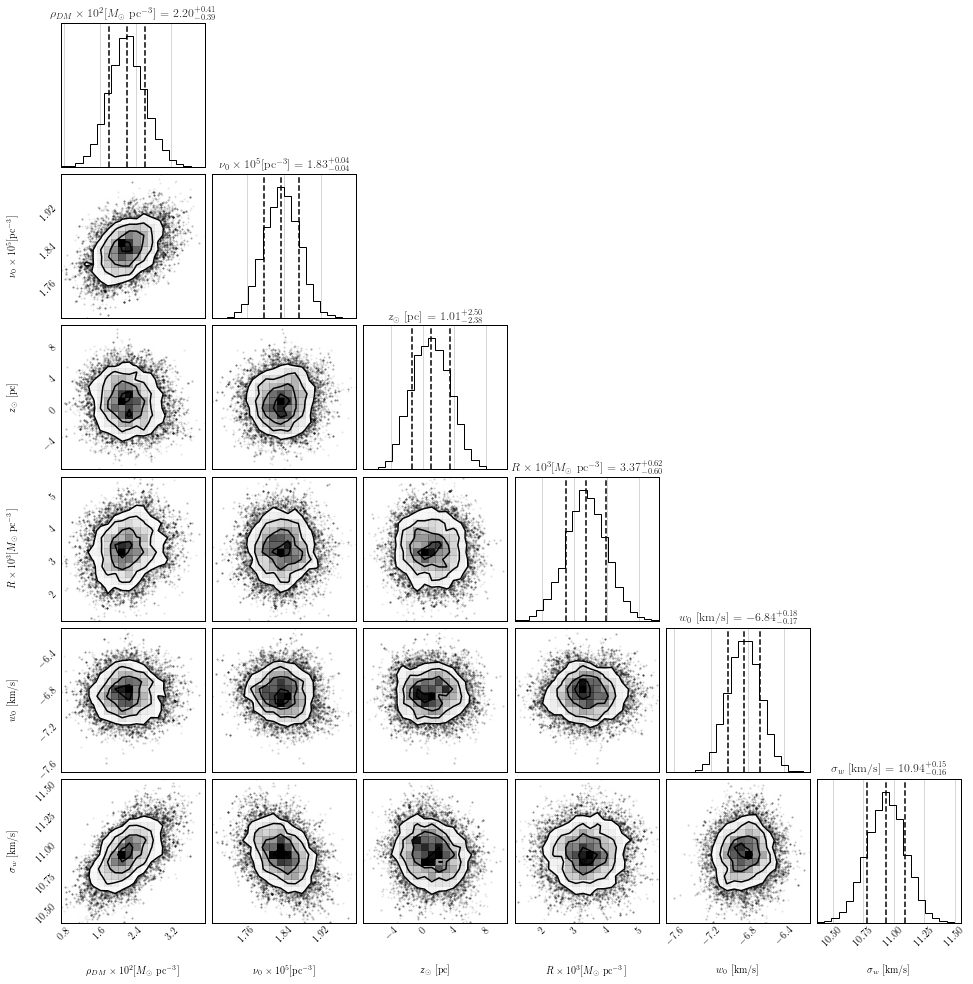

In [16]:
samples = sampler_new.get_chain()
plot_corner(samples, dim, consume_samples_dm)

100%|██████████| 500/500 [00:15<00:00, 33.29it/s]


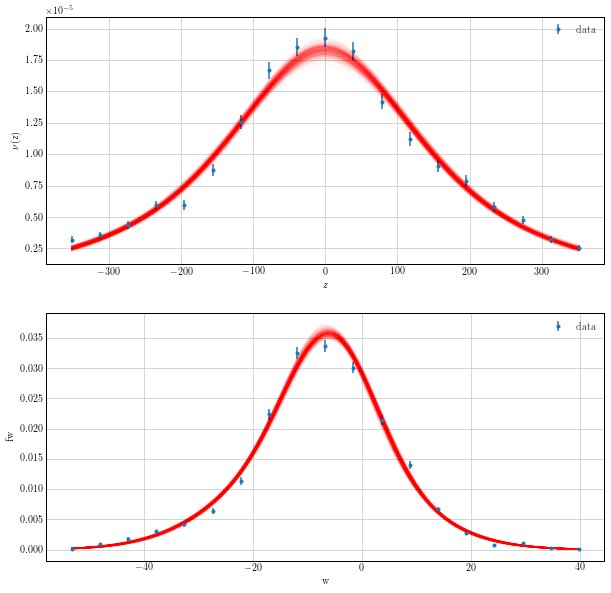

In [17]:
plot_fitting_dm(sampler_new, data, dim, alpha=0.01, n=500)

In [21]:
df = get_dataframe_dm(sampler_new, dim, locs, scales, norm_list_DM, uni_list_DM, nwalkers, simple=simple)
df

Time: 106.77 s


#,rhoDM,log_nu0,zsun,R,log_prior,log_posterior,log_likelihood,w0_0,log_sigma_w_0,a_0,w0_1,log_sigma_w_1,a_1,walker
0,0.012964315673254737,-10.536126524667113,8.408200817971721,0.0030841999085589275,-1.4932326535440863,270.8472328770573,272.3404655306014,-7.698302969502797,2.9378472415477845,0.606040019580977,-5.6749011317886,2.1795542839969557,0.2964625489472646,0
1,0.012964315673254737,-10.536126524667113,8.408200817971721,0.0030841999085589275,-1.4932326535440863,270.8472328770573,272.3404655306014,-7.698302969502797,2.9378472415477845,0.606040019580977,-5.6749011317886,2.1795542839969557,0.2964625489472646,0
2,0.012964315673254737,-10.536126524667113,8.408200817971721,0.0030841999085589275,-1.4932326535440863,270.8472328770573,272.3404655306014,-7.698302969502797,2.9378472415477845,0.606040019580977,-5.6749011317886,2.1795542839969557,0.2964625489472646,0
3,0.012964315673254737,-10.536126524667113,8.408200817971721,0.0030841999085589275,-1.4932326535440863,270.8472328770573,272.3404655306014,-7.698302969502797,2.9378472415477845,0.606040019580977,-5.6749011317886,2.1795542839969557,0.2964625489472646,0
4,0.012964315673254737,-10.536126524667113,8.408200817971721,0.0030841999085589275,-1.4932326535440863,270.8472328770573,272.3404655306014,-7.698302969502797,2.9378472415477845,0.606040019580977,-5.6749011317886,2.1795542839969557,0.2964625489472646,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"104,995",0.0015162087854679882,-10.552489505327882,21.729366008821785,0.00323503043657726,-1.3925177356297818,306.50390148134204,307.8964192169718,-8.885209438733622,2.990655851223818,0.49166436377199735,-6.454824081110042,2.2266378225698977,0.3868705024630355,20
"104,996",0.0015162087854679882,-10.552489505327882,21.729366008821785,0.00323503043657726,-1.3925177356297818,306.50390148134204,307.8964192169718,-8.885209438733622,2.990655851223818,0.49166436377199735,-6.454824081110042,2.2266378225698977,0.3868705024630355,20
"104,997",0.0020934029665912075,-10.552431701215701,20.646286282729662,0.0033656347804841306,-1.356359418208231,307.71842138932743,309.07478080753566,-8.850852464079521,2.990811797001533,0.49266586347810837,-6.382794772345305,2.232132520373833,0.38702633081362503,20
"104,998",0.0020934029665912075,-10.552431701215701,20.646286282729662,0.0033656347804841306,-1.356359418208231,307.71842138932743,309.07478080753566,-8.850852464079521,2.990811797001533,0.49266586347810837,-6.382794772345305,2.232132520373833,0.38702633081362503,20


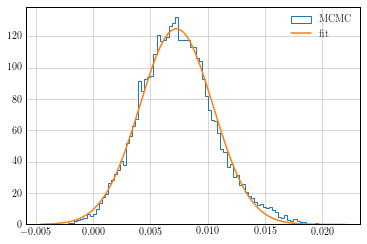

array([0.00728028, 0.00319516])

In [24]:
from scipy.optimize import curve_fit
from scipy.stats import norm

rhoDM = df["rhoDM"].to_numpy()
rhoDM = np.sort(rhoDM)
ycum = np.arange(len(rhoDM))
ycum = ycum / ycum.max()

popt, pcov = curve_fit(norm.cdf, rhoDM, ycum, p0=[0.04, 0.01])

plt.hist(rhoDM, bins=100, density=True, histtype="step", label="MCMC")
plt.plot(rhoDM, norm.pdf(rhoDM, *popt), label="fit")
plt.legend()
plt.show()
popt

# DM Halo full

In [25]:
## initialize prior
simple = False
cores = 16
locs, scales, uni_list_DM, norm_list_DM = initialize_prior_dm(dim, w0, sigma_w, a_raw, simple=simple)
locs, scales, uni_list_DM, norm_list_DM

({'rhoDM': -0.05,
  'log_nu0': -13.815510557964274,
  'zsun': -40,
  'R': 0.0034,
  'w0': array([-26.05893389, -28.33189244]),
  'log_sigma_w': array([2.56418819, 1.70412724]),
  'a': array([0.49026632, 0.21114664]),
  'rhos': array([0.0104, 0.0277, 0.0073, 0.0005, 0.0006, 0.0018, 0.0018, 0.0029,
         0.0072, 0.0216, 0.0056, 0.0015]),
  'sigmaz': array([ 3.7,  7.1, 22.1, 39. , 15.5,  7.5, 12. , 18. , 18.5, 18.5, 20. ,
         20. ])},
 {'rhoDM': 0.15000000000000002,
  'log_nu0': 4.605170185988092,
  'zsun': 80,
  'R': 0.0006,
  'w0': array([40, 40]),
  'log_sigma_w': array([0.61903921, 0.61903921]),
  'a': array([0.42022827, 0.18098284]),
  'rhos': array([3.12e-03, 5.54e-03, 7.00e-04, 3.00e-05, 6.00e-05, 1.80e-04,
         1.80e-04, 2.90e-04, 7.20e-04, 2.80e-03, 1.00e-03, 5.00e-04]),
  'sigmaz': array([0.2, 0.5, 2.4, 4. , 1.6, 2. , 2.4, 1.8, 1.9, 4. , 5. , 5. ])},
 ['rhoDM', 'log_nu0', 'zsun', 'log_sigma_w', 'w0', 'a'],
 ['R', 'rhos', 'sigmaz'])

In [26]:
## initialize walkers
p0, ndim, nwalkers = initialize_walkers_dm(locs, scales, dim, simple=simple)
p0.shape, ndim, nwalkers

((69, 34), 34, 69)

In [27]:
uni_list_DM, norm_list_DM

(['rhoDM', 'log_nu0', 'zsun', 'log_sigma_w', 'w0', 'a'],
 ['R', 'rhos', 'sigmaz'])

In [28]:
for i, p00 in enumerate(p0):
    res = log_posterior_dm(p00, data, locs, scales, dim, norm_list_DM, uni_list_DM, simple=simple)
    if np.isnan(res):
        print(i, p00)

100%|██████████| 500/500 [01:24<00:00,  5.95it/s]


Multiprocessing took 84.4 seconds


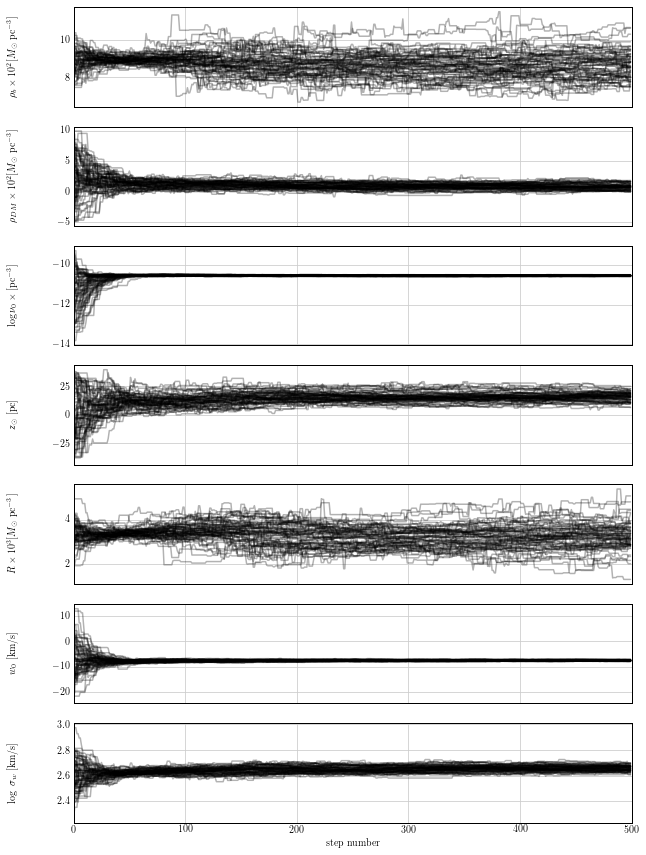

In [29]:
sampler = run_mcmc(
    nwalkers, ndim, p0, dim, log_posterior_dm, consume_samples_dm, cores=cores,
    args=[data, locs, scales, dim, norm_list_DM, uni_list_DM, simple], 
    plot=True, step=500, simple=simple
)

100%|██████████| 1000/1000 [02:34<00:00,  6.46it/s]


Multiprocessing took 155.1 seconds


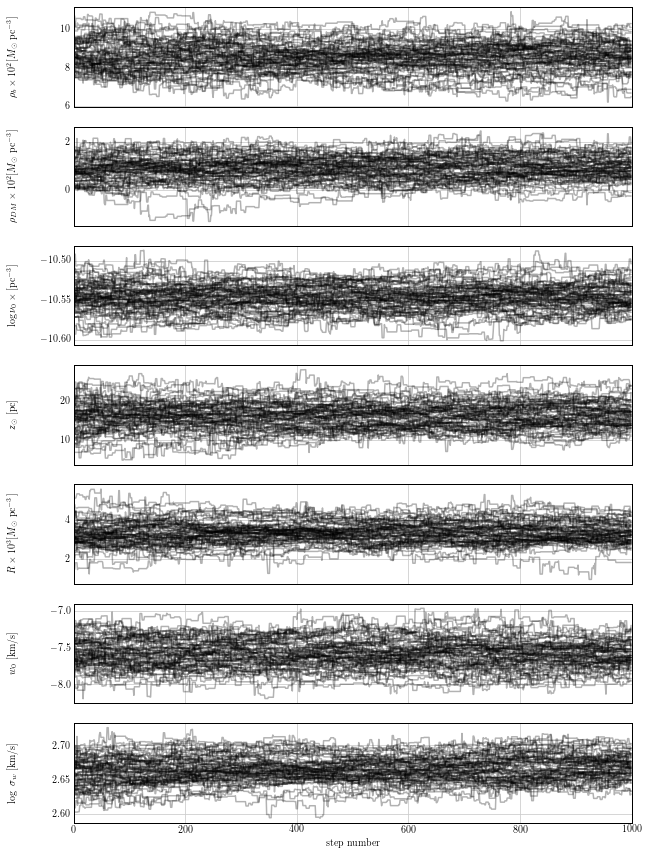

In [30]:
## run again, with the last sample as the initial point
next_p0 = sampler.get_chain()[-1]
sampler_new = run_mcmc(
    nwalkers, ndim, next_p0, dim, log_posterior_dm, consume_samples_dm, cores=cores,
    args=[data, locs, scales, dim, norm_list_DM, uni_list_DM, simple], 
    plot=True, step=1000, simple=simple
)

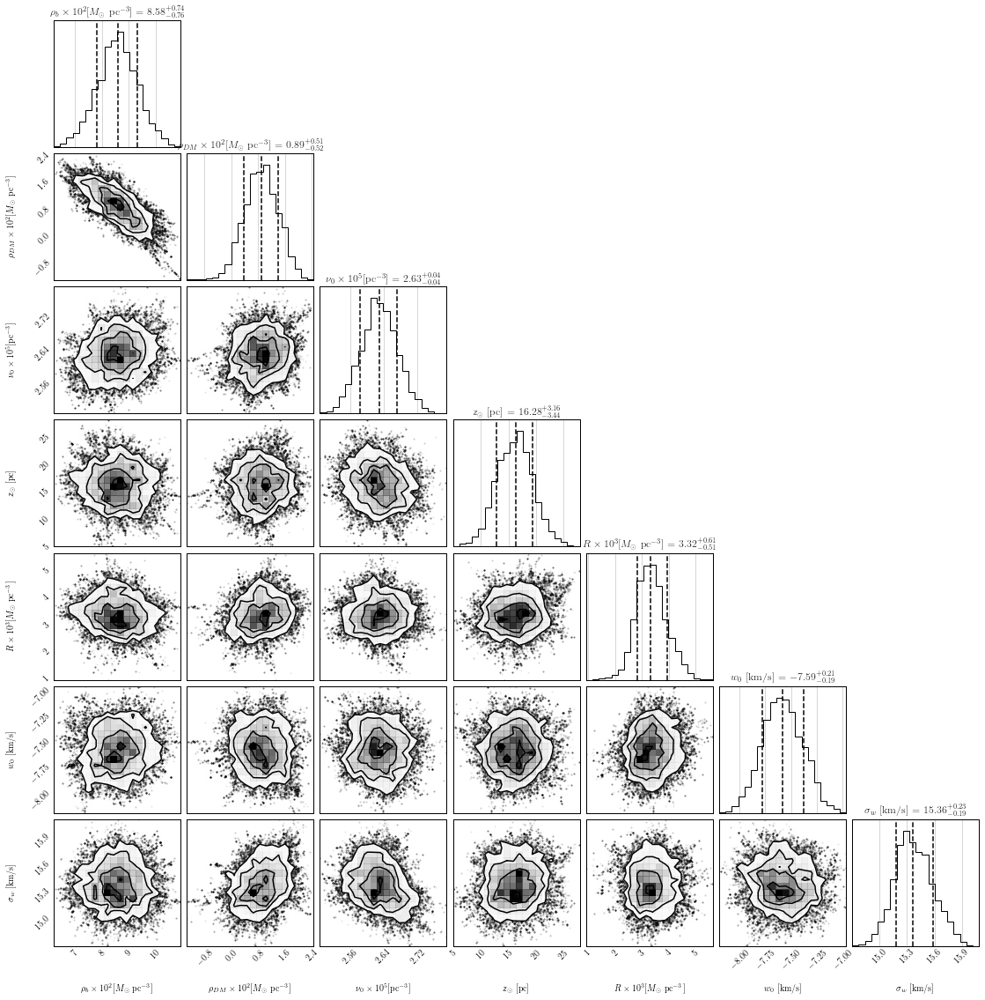

In [31]:
samples = sampler_new.get_chain()
plot_corner(samples, dim, consume_samples_dm, simple=simple)

100%|██████████| 500/500 [00:14<00:00, 34.88it/s]


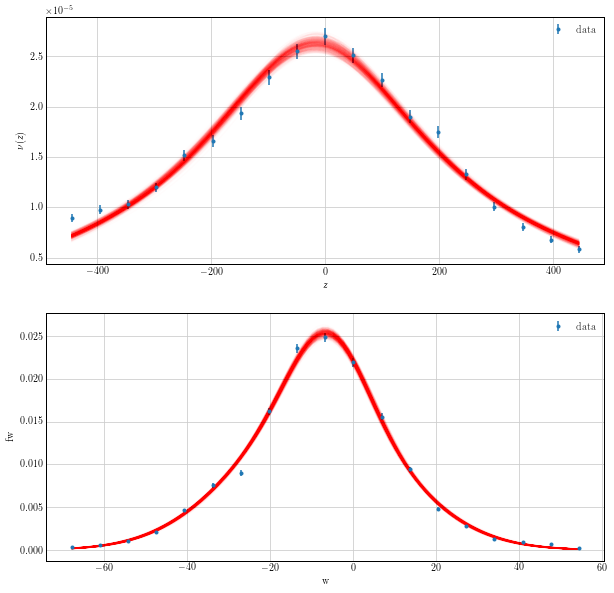

In [32]:
plot_fitting_dm(sampler_new, data, dim, alpha=0.01, n=500, simple=simple)

In [23]:
df = get_dataframe_dm(sampler_new, dim, locs, scales, norm_list_DM, uni_list_DM, nwalkers, simple=simple)
df

Time: 39.11 s


#,rhoDM,log_nu0,zsun,R,log_prior,log_posterior,log_likelihood,w0_0,log_sigma_w_0,a_0,rhob_0,sigmaz_0,rhob_1,sigmaz_1,rhob_2,sigmaz_2,rhob_3,sigmaz_3,rhob_4,sigmaz_4,rhob_5,sigmaz_5,rhob_6,sigmaz_6,rhob_7,sigmaz_7,rhob_8,sigmaz_8,rhob_9,sigmaz_9,rhob_10,sigmaz_10,rhob_11,sigmaz_11,walker
0,0.040343085350382425,-11.435954053944307,-1.761147496539345,0.002603490991634207,51.657678013939105,410.5603563974866,358.9026783835475,-7.2525343848143935,2.225661744164795,0.9807389371952746,0.012908938783032946,3.675089840999213,0.024095229916112595,7.440475863553523,0.0066132841055103996,22.327974866307944,0.00047757660576867313,35.26364039499879,0.0005821539424703458,16.263715868532238,0.0018374371676790596,8.616026132147253,0.0014297377379682275,11.823051110051313,0.0031732631476198907,20.391601318631487,0.007294607725132356,19.20272764478832,0.019270534100509756,18.682168853543587,0.007435394237047279,22.13790204927248,0.001795026791249963,14.451974024739831,11
1,0.040343085350382425,-11.435954053944307,-1.761147496539345,0.002603490991634207,51.657678013939105,410.5603563974866,358.9026783835475,-7.2525343848143935,2.225661744164795,0.9807389371952746,0.012908938783032946,3.675089840999213,0.024095229916112595,7.440475863553523,0.0066132841055103996,22.327974866307944,0.00047757660576867313,35.26364039499879,0.0005821539424703458,16.263715868532238,0.0018374371676790596,8.616026132147253,0.0014297377379682275,11.823051110051313,0.0031732631476198907,20.391601318631487,0.007294607725132356,19.20272764478832,0.019270534100509756,18.682168853543587,0.007435394237047279,22.13790204927248,0.001795026791249963,14.451974024739831,11
2,0.040343085350382425,-11.435954053944307,-1.761147496539345,0.002603490991634207,51.657678013939105,410.5603563974866,358.9026783835475,-7.2525343848143935,2.225661744164795,0.9807389371952746,0.012908938783032946,3.675089840999213,0.024095229916112595,7.440475863553523,0.0066132841055103996,22.327974866307944,0.00047757660576867313,35.26364039499879,0.0005821539424703458,16.263715868532238,0.0018374371676790596,8.616026132147253,0.0014297377379682275,11.823051110051313,0.0031732631476198907,20.391601318631487,0.007294607725132356,19.20272764478832,0.019270534100509756,18.682168853543587,0.007435394237047279,22.13790204927248,0.001795026791249963,14.451974024739831,11
3,0.040343085350382425,-11.435954053944307,-1.761147496539345,0.002603490991634207,51.657678013939105,410.5603563974866,358.9026783835475,-7.2525343848143935,2.225661744164795,0.9807389371952746,0.012908938783032946,3.675089840999213,0.024095229916112595,7.440475863553523,0.0066132841055103996,22.327974866307944,0.00047757660576867313,35.26364039499879,0.0005821539424703458,16.263715868532238,0.0018374371676790596,8.616026132147253,0.0014297377379682275,11.823051110051313,0.0031732631476198907,20.391601318631487,0.007294607725132356,19.20272764478832,0.019270534100509756,18.682168853543587,0.007435394237047279,22.13790204927248,0.001795026791249963,14.451974024739831,11
4,0.03703091807439261,-11.41937065866105,-0.6990038390916737,0.002733234383625646,44.74966871532379,399.1449664872065,354.3952977718827,-7.15649731666402,2.2184977703637143,0.9530009328322986,0.012354696866264598,3.520266342159072,0.022038584485072978,7.48043655862936,0.006521762022736953,22.716779612480554,0.0004828378100468586,33.213528344170776,0.0005891853109922176,16.62971304078334,0.001718815098210656,6.913207711012326,0.001246309813726082,12.516404146983039,0.00311363142036477,21.119987314463845,0.0073602926011047615,20.31483227237394,0.020455633129767684,19.095092403326987,0.00827404855702565,22.908625788538956,0.0021845709693024827,15.25834407759569,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"31,495",0.04033286018857614,-11.495927501568183,-6.780159299548875,0.003520895601629805,48.780168814820314,405.57424943648766,356.7940806216674,-6.968730470677256,2.224453872825888,

# DD only

In [9]:
## initialize prior
from utils import initialize_prior_dd

simple = True
cores = 16
locs, scales, uni_list_DM, norm_list_DM = initialize_prior_dd(dim, w0, sigma_w, a_raw, simple=simple)
locs, scales, uni_list_DM, norm_list_DM

({'sigmaDD': 0.1,
  'log_hDD': 2,
  'log_nu0': -13.815510557964274,
  'zsun': -40,
  'R': 0.0034,
  'w0': array([-26.7145192 , -26.70622469]),
  'log_sigma_w': array([2.35840538, 1.71660979]),
  'a': array([0.37196607, 0.32629411])},
 {'sigmaDD': 19.9,
  'log_hDD': 4.907755278982137,
  'log_nu0': 4.605170185988092,
  'zsun': 80,
  'R': 0.0006,
  'w0': array([40, 40]),
  'log_sigma_w': array([0.61903921, 0.61903921]),
  'a': array([0.31882806, 0.27968066])},
 ['sigmaDD', 'log_hDD', 'log_nu0', 'zsun', 'log_sigma_w', 'w0', 'a'],
 ['R'])

In [10]:
from utils import initialize_walkers_dd

## initialize walkers
p0, ndim, nwalkers = initialize_walkers_dd(locs, scales, dim, simple=simple)
p0.shape, ndim, nwalkers

((23, 11), 11, 23)

In [11]:
uni_list_DM, norm_list_DM

(['sigmaDD', 'log_hDD', 'log_nu0', 'zsun', 'log_sigma_w', 'w0', 'a'], ['R'])

In [12]:
from utils import log_posterior_dd

for p00 in p0:
    print(log_posterior_dd(p00, data, locs, scales, dim, norm_list_DM, uni_list_DM, simple=simple))

-3375.127914930261
-4505.092896432329
-3407.1453462176705
-727.249130139498
-9586.23359575443
-24049.49024508139
-9777.385512379084
-897.5306918053031
-3060.4908892591134
-4410.116600247845
-2512.9625290740464
-2855.6851070743937
-16116.79778135628
-3760.422945974753
-16853.306288361215
-3184.0292792741025
-8894.657169870747
-2046.9145335913945
-4398.665897604742
-2803.53434427578
-4484.452624914204
-4675.075900781435
-7171.060399153207


# debugging

In [18]:
# def consume_samples_dd(samples_raw, dim, simple=True, flatten=False):
#     skip = 0
#     tot = 8
#     labels = []
#     if flatten:
#         labels = [
#             r"$\rho_{b}\times 10^2 [M_{\odot}$ pc$^{-3}]$",
#             r"$\rho_{d}\times 10^2 [M_{\odot}$ pc$^{-3}]$",
#             r"$\sigma_{DD}\ [M_{\odot}$ pc$^{-2}]$",
#             r"$h_{DD}$ [pc]",
#             r"$\nu_0\times 10^5 [$pc$^{-3}]$", 
#             r"$z_{\odot}$ [pc]", 
#             r"$R\times 10^3 [M_{\odot}$ pc$^{-3}]$",
#             r"$w_0$ [km/s]",
#             r"$\sigma_{w}$ [km/s]"]
#     else:
#         labels = [
#             r"$\rho_{b}\times 10^2 [M_{\odot}$ pc$^{-3}]$",
#             r"$\rho_{d}\times 10^2 [M_{\odot}$ pc$^{-3}]$",
#             r"$\sigma_{DD}\ [M_{\odot}$ pc$^{-2}]$",
#             r"$\log\ h_{DD}$ [pc]",
#             r"$\log \nu_0\times [$pc$^{-3}]$", 
#             r"$z_{\odot}$ [pc]", 
#             r"$R\times 10^3 [M_{\odot}$ pc$^{-3}]$",
#             r"$w_0$ [km/s]",
#             r"$\log\ \sigma_{w}$ [km/s]"]
#     rho_b = 0
#     if simple:
#         labels = labels[1:]
#     else:
#         tot += 1
#         rho_b = np.sum(samples_raw[:, :, 0:12], axis=2)
#         skip = 24 
#     samples = samples_raw[:, :, skip:skip+tot].copy()
#     w0 = samples_raw[:, :, skip+5:skip+5+dim]
#     log_sigma_w = samples_raw[:, :, skip+5+dim:skip+5+2*dim]
#     a = samples_raw[:, :, skip+5+2*dim:skip+5+3*dim]

#     samples[:, :, 4] = samples[:, :, 4]/1E-3 # R
#     samples[:, :, 5] = np.average(w0, axis=2, weights=a) # w0
#     rho_d = samples[:, :, 0]/(4*np.exp(samples[:, :, 1])) #effective rhoDM
#     if flatten:
#         sigma_w = np.exp(log_sigma_w)
#         samples[:, :, 1] = np.exp(samples[:, :, 1]) # hDD
#         samples[:, :, 2] = np.exp(samples[:, :, 2])/1E-5 # nu0
#         samples[:, :, 6] = np.average(sigma_w, axis=2, weights=a) # sigma_w
#     else:
#         samples[:, :, 6] = np.average(log_sigma_w, axis=2, weights=a) # sigma_w
#     if not simple:
#         # shift
#         for i in range(tot-1,1, -1):
#             samples[:, :, i] = samples[:, :, i-2]
#         samples[:, :, 0] = rho_b/1E-2
#         samples[:, :, 1] = rho_d/1E-2
#     else:
#         for i in range(tot-1,0, -1):
#             samples[:, :, i] = samples[:, :, i-1]
#         samples[:, :, 0] = rho_d/1E-2
#     if flatten:
#         samples = samples.reshape(-1, tot)
#     return samples, labels

# end debugging

100%|██████████| 500/500 [00:48<00:00, 10.29it/s]


Multiprocessing took 48.7 seconds


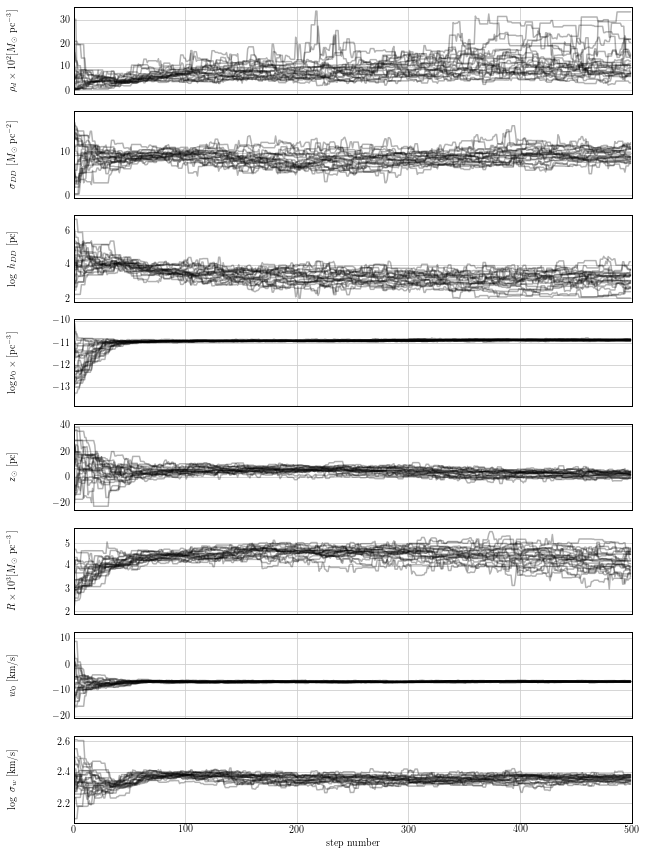

In [13]:
from utils import consume_samples_dd

sampler = run_mcmc(
    nwalkers, ndim, p0, dim, log_posterior_dd, consume_samples_dd, cores=cores,
    args=[data, locs, scales, dim, norm_list_DM, uni_list_DM, simple], 
    plot=True, step=500, simple=simple
)

100%|██████████| 1000/1000 [01:33<00:00, 10.71it/s]


Multiprocessing took 93.5 seconds


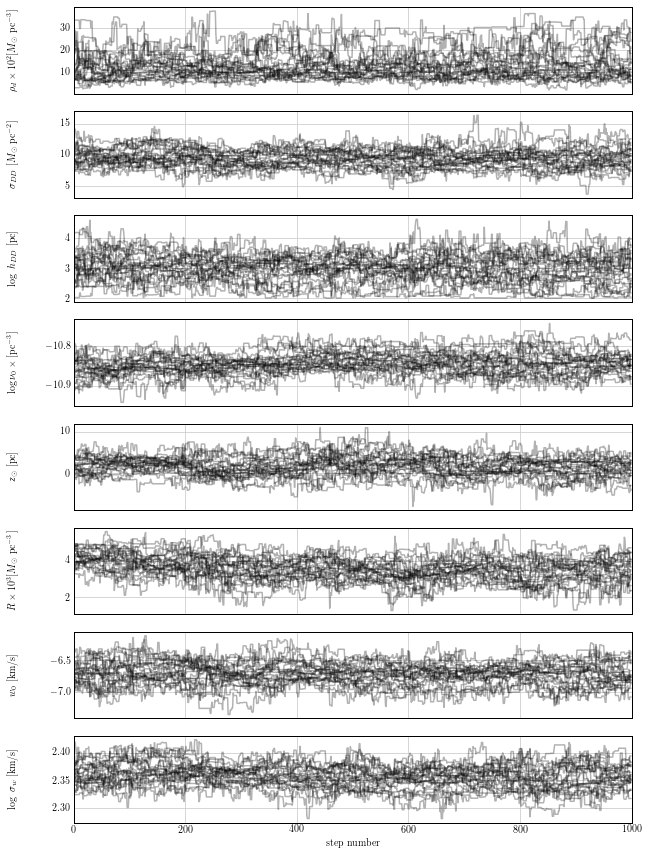

In [14]:
## run again, with the last sample as the initial point
next_p0 = sampler.get_chain()[-1]
sampler_new = run_mcmc(
    nwalkers, ndim, next_p0, dim, log_posterior_dd, consume_samples_dd, cores=cores,
    args=[data, locs, scales, dim, norm_list_DM, uni_list_DM, simple], 
    plot=True, step=1000, simple=simple
)

100%|██████████| 4000/4000 [06:16<00:00, 10.61it/s]


Multiprocessing took 377.1 seconds


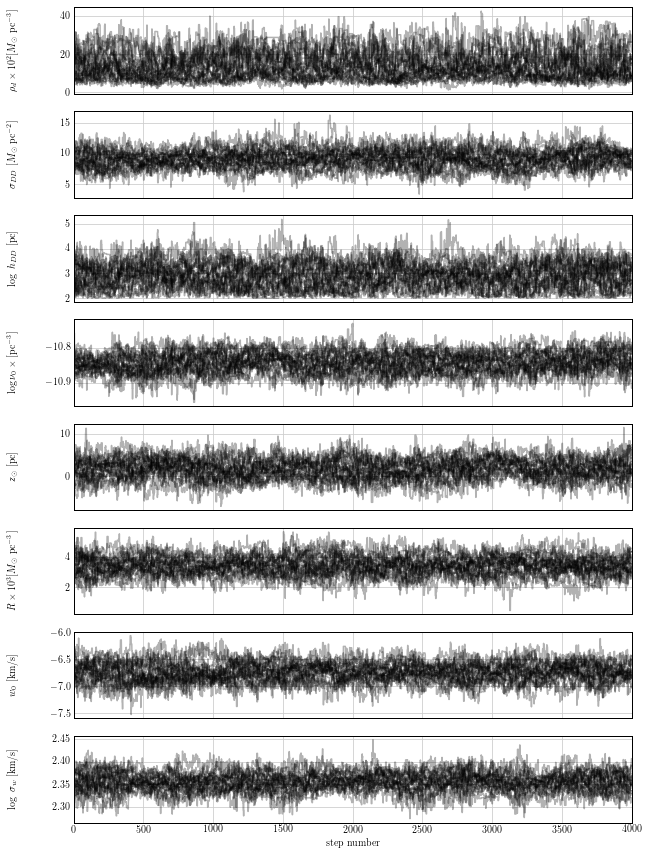

In [16]:
########################################################
## if unsatisfied, run again
## run again, with the last sample as the initial point
next_p0 = sampler_new.get_chain()[-1]
sampler_new = run_mcmc(
    nwalkers, ndim, next_p0, dim, log_posterior_dd, consume_samples_dd, cores=cores,
    args=[data, locs, scales, dim, norm_list_DM, uni_list_DM, simple], 
    plot=True, step=4000, simple=simple
)
########################################################

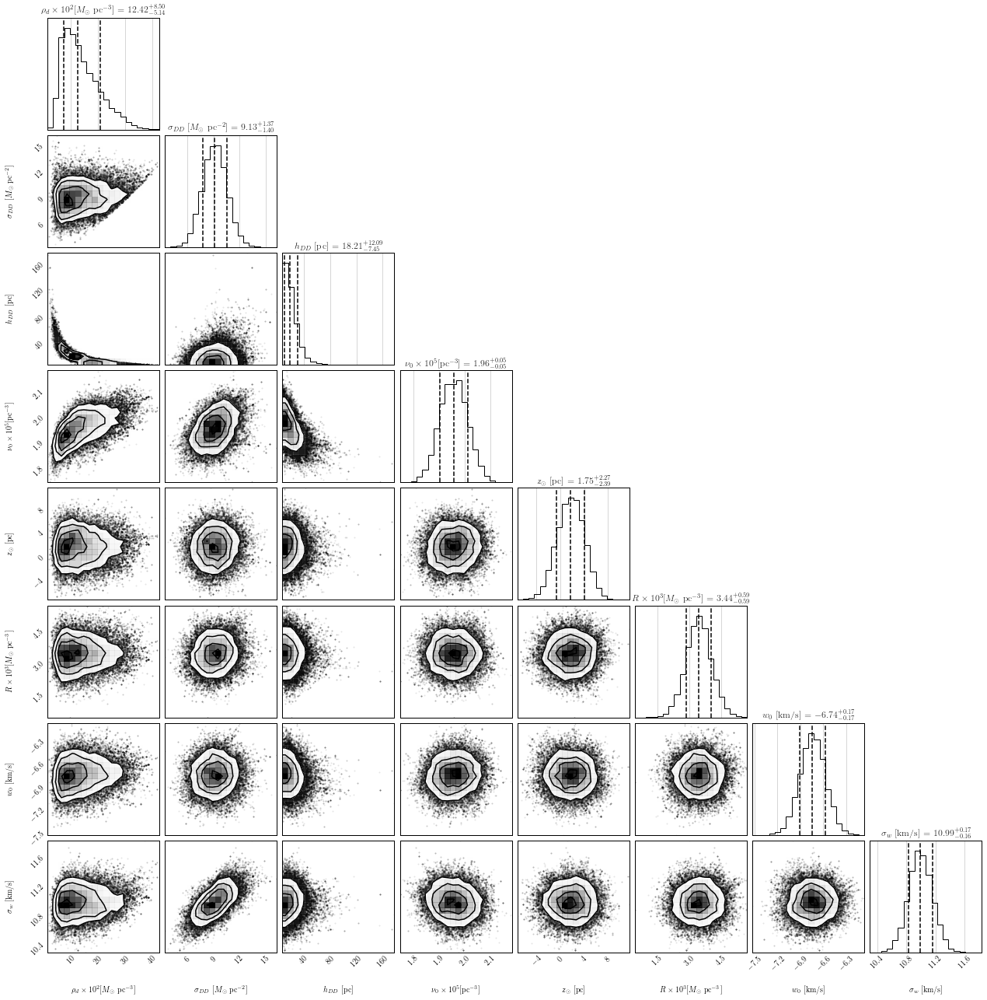

In [17]:
samples = sampler_new.get_chain()
plot_corner(samples, dim, consume_samples_dd, simple=simple)

100%|██████████| 500/500 [00:15<00:00, 32.41it/s]


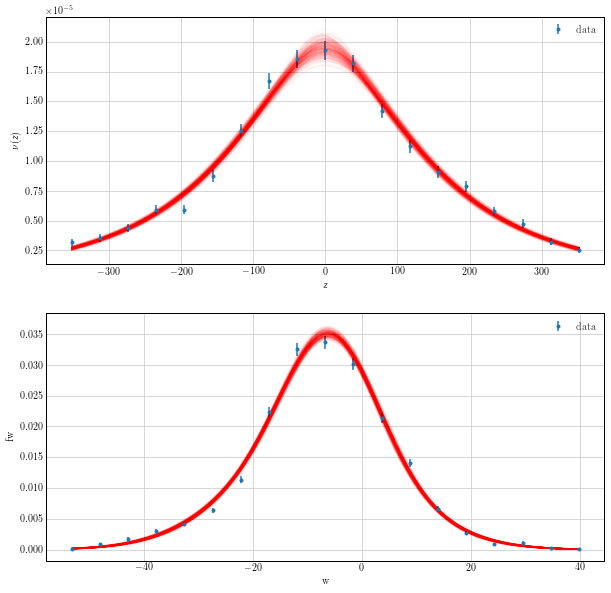

In [17]:
from utils import plot_fitting_dd

plot_fitting_dd(sampler_new, data, dim, alpha=0.01, n=500, simple=simple)

# DD only full

# DD & DM Halo

In [9]:
## initialize prior
from utils import initialize_prior_dd_dm

simple = True
cores = 16
locs, scales, uni_list_DM, norm_list_DM = initialize_prior_dd_dm(dim, w0, sigma_w, a_raw, simple=simple)
locs, scales, uni_list_DM, norm_list_DM

({'rhoDM': -0.05,
  'sigmaDD': 0.1,
  'log_hDD': 2,
  'log_nu0': -13.815510557964274,
  'zsun': -40,
  'R': 0.0034,
  'w0': array([-26.64731666]),
  'log_sigma_w': array([1.49998847]),
  'a': array([0.67074305])},
 {'rhoDM': 0.15000000000000002,
  'sigmaDD': 49.9,
  'log_hDD': 4.907755278982137,
  'log_nu0': 4.605170185988092,
  'zsun': 80,
  'R': 0.0006,
  'w0': array([40]),
  'log_sigma_w': array([0.61903921]),
  'a': array([0.57492262])},
 ['rhoDM', 'sigmaDD', 'log_hDD', 'log_nu0', 'zsun', 'log_sigma_w', 'w0', 'a'],
 ['R'])

In [10]:
from utils import initialize_walkers_dd_dm

## initialize walkers
p0, ndim, nwalkers = initialize_walkers_dd_dm(locs, scales, dim, simple=simple)
p0.shape, ndim, nwalkers

((19, 9), 9, 19)

In [11]:
uni_list_DM, norm_list_DM

(['rhoDM', 'sigmaDD', 'log_hDD', 'log_nu0', 'zsun', 'log_sigma_w', 'w0', 'a'],
 ['R'])

In [12]:
from utils import log_posterior_dd_dm

for p00 in p0:
    print(log_posterior_dd_dm(p00, data, locs, scales, dim, norm_list_DM, uni_list_DM, simple=simple))

-14093.087359170286
-2572.817992527577
-240.8573307543394
-618.0987908711223
-6418.303145494848
-451.9510678239118
70.97102761337244
-7376.476584244973
-52143.921192187474
-3552.0390179830824
-18671.071484431668
-389.96998112912263
-16731.027781213208
-28661.31650756662
-9103.71737565259
-22045.837865779253
-21146.40020970628
-7663.084697414305
-3389.7360099368348


100%|██████████| 500/500 [00:39<00:00, 12.63it/s]


Multiprocessing took 39.7 seconds


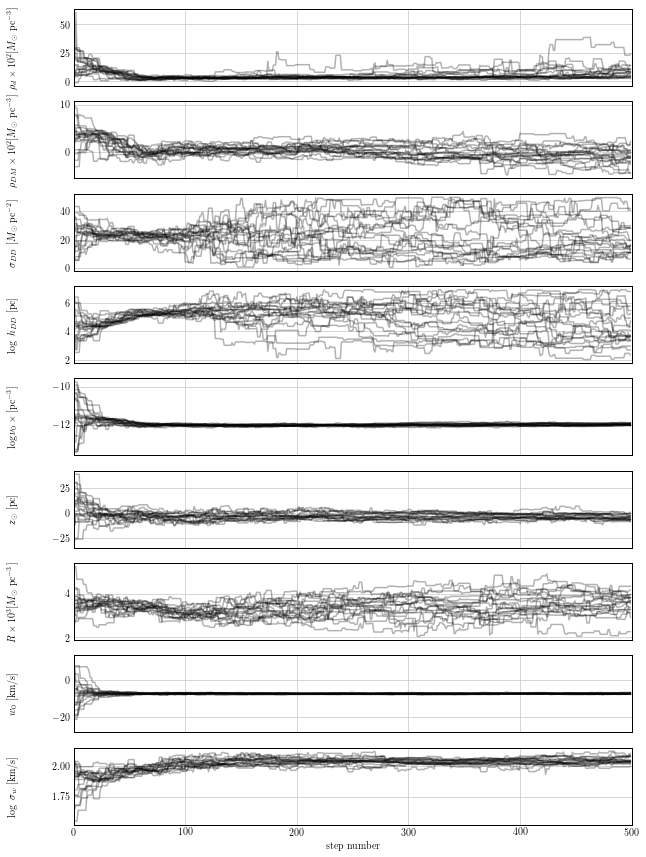

In [13]:
from utils import consume_samples_dd_dm

sampler = run_mcmc(
    nwalkers, ndim, p0, dim, log_posterior_dd_dm, consume_samples_dd_dm, cores=cores,
    args=[data, locs, scales, dim, norm_list_DM, uni_list_DM, simple], 
    plot=True, step=500, simple=simple
)

100%|██████████| 1000/1000 [01:19<00:00, 12.58it/s]


Multiprocessing took 79.7 seconds


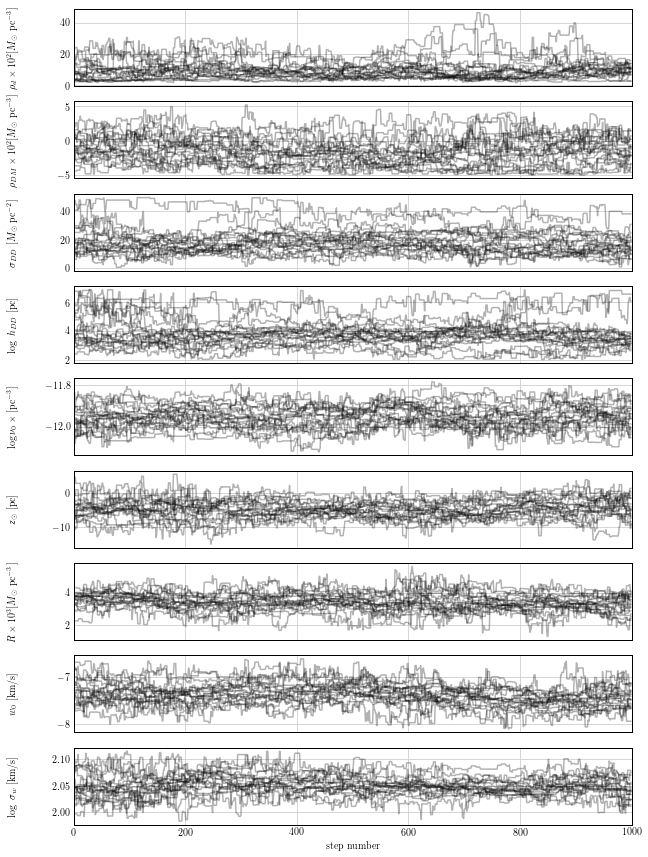

In [14]:
## run again, with the last sample as the initial point
next_p0 = sampler.get_chain()[-1]
sampler_new = run_mcmc(
    nwalkers, ndim, next_p0, dim, log_posterior_dd_dm, consume_samples_dd_dm, cores=cores,
    args=[data, locs, scales, dim, norm_list_DM, uni_list_DM, simple], 
    plot=True, step=1000, simple=simple
)

100%|██████████| 2000/2000 [02:39<00:00, 12.51it/s]


Multiprocessing took 160.0 seconds


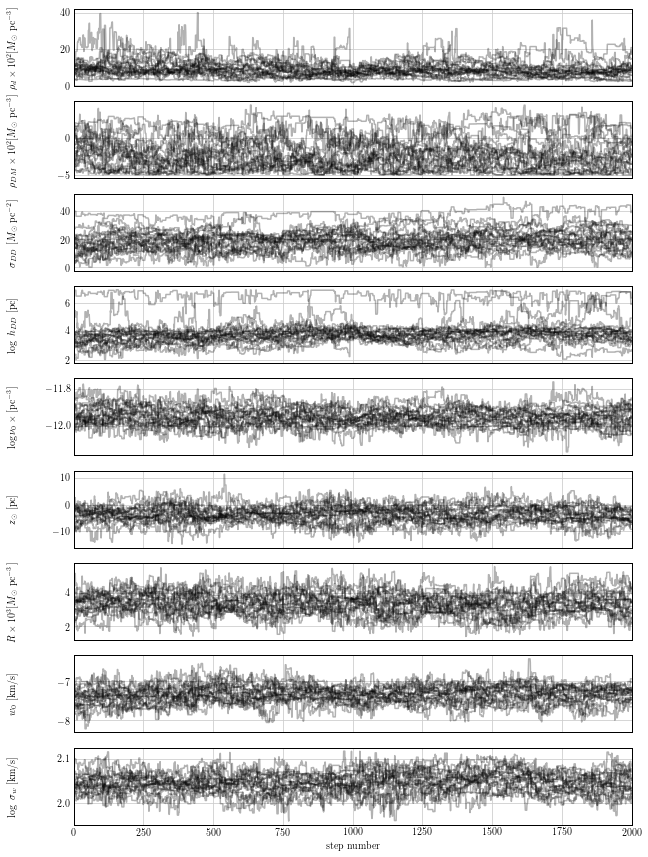

In [15]:
########################################################
## run again, with the last sample as the initial point
next_p0 = sampler_new.get_chain()[-1]
sampler_new = run_mcmc(
    nwalkers, ndim, next_p0, dim, log_posterior_dd_dm, consume_samples_dd_dm, cores=cores,
    args=[data, locs, scales, dim, norm_list_DM, uni_list_DM, simple], 
    plot=True, step=2000, simple=simple
)
########################################################

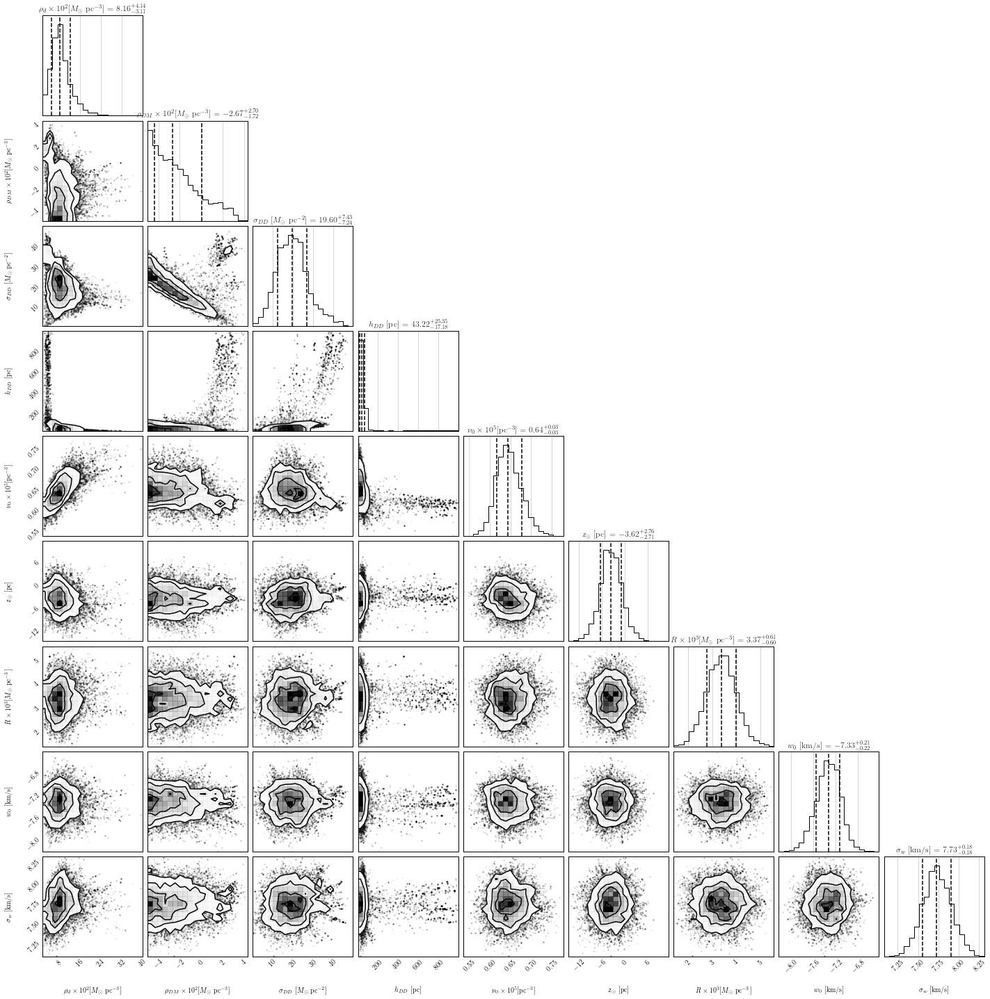

In [16]:
samples = sampler_new.get_chain()
plot_corner(samples, dim, consume_samples_dd_dm, simple=simple)

100%|██████████| 500/500 [00:14<00:00, 33.92it/s]


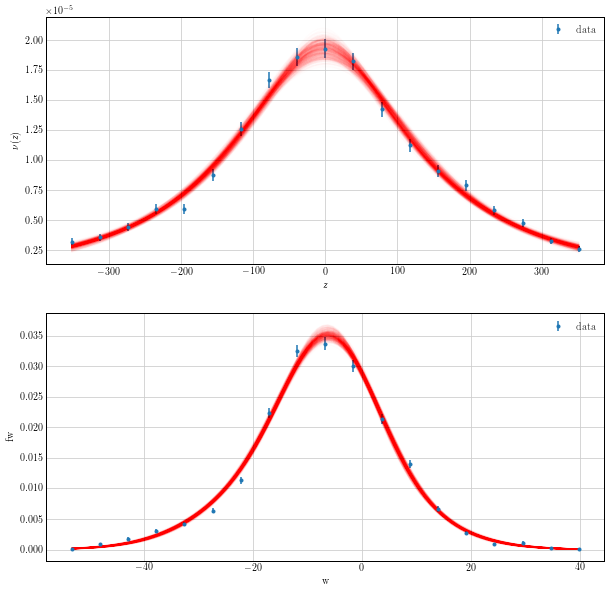

In [26]:
from utils import plot_fitting_dd_dm

plot_fitting_dd_dm(sampler_new, data, dim, alpha=0.01, n=500, simple=simple)

# DD & DM Halo Full

In [9]:
## initialize prior
from utils import initialize_prior_dd_dm

simple = False
cores = 16
locs, scales, uni_list_DM, norm_list_DM = initialize_prior_dd_dm(dim, w0, sigma_w, a_raw, simple=simple)
locs, scales, uni_list_DM, norm_list_DM

({'rhoDM': -0.03,
  'sigmaDD': 0.1,
  'log_hDD': 2,
  'log_nu0': -13.815510557964274,
  'zsun': -40,
  'R': 0.0034,
  'w0': array([-26.64731666]),
  'log_sigma_w': array([1.49998847]),
  'a': array([0.67074305]),
  'rhos': array([0.0104, 0.0277, 0.0073, 0.0005, 0.0006, 0.0018, 0.0018, 0.0029,
         0.0072, 0.0216, 0.0056, 0.0015]),
  'sigmaz': array([ 3.7,  7.1, 22.1, 39. , 15.5,  7.5, 12. , 18. , 18.5, 18.5, 20. ,
         20. ])},
 {'rhoDM': 0.13,
  'sigmaDD': 49.9,
  'log_hDD': 2.605170185988092,
  'log_nu0': 4.605170185988092,
  'zsun': 80,
  'R': 0.0006,
  'w0': array([40]),
  'log_sigma_w': array([0.61903921]),
  'a': array([0.57492262]),
  'rhos': array([3.12e-03, 5.54e-03, 7.00e-04, 3.00e-05, 6.00e-05, 1.80e-04,
         1.80e-04, 2.90e-04, 7.20e-04, 2.80e-03, 1.00e-03, 5.00e-04]),
  'sigmaz': array([0.2, 0.5, 2.4, 4. , 1.6, 2. , 2.4, 1.8, 1.9, 4. , 5. , 5. ])},
 ['rhoDM', 'sigmaDD', 'log_hDD', 'log_nu0', 'zsun', 'log_sigma_w', 'w0', 'a'],
 ['R', 'rhos', 'sigmaz'])

In [10]:
from utils import initialize_walkers_dd_dm

## initialize walkers
p0, ndim, nwalkers = initialize_walkers_dd_dm(locs, scales, dim, simple=simple)
p0.shape, ndim, nwalkers

((67, 33), 33, 67)

In [11]:
uni_list_DM, norm_list_DM

(['rhoDM', 'sigmaDD', 'log_hDD', 'log_nu0', 'zsun', 'log_sigma_w', 'w0', 'a'],
 ['R', 'rhos', 'sigmaz'])

In [12]:
from utils import log_posterior_dd_dm

for p00 in p0:
    res = log_posterior_dd_dm(p00, data, locs, scales, dim, norm_list_DM, uni_list_DM, simple=simple)
    if np.isnan(res):
        print(p00)

In [20]:
samples = np.empty((500, 20, 5))

# add empty columns to the end
sh = samples.shape
samples = np.concatenate((samples, np.zeros((sh[0], sh[1], 2))), axis=2)
samples.shape

(500, 20, 7)

In [24]:
def consume_samples_dd_dm(samples_raw, dim, simple=True, flatten=False):
    skip = 0
    tot = 9
    labels = []
    if flatten:
        labels = [
            r"$\rho_{b}\times 10^2 [M_{\odot}$ pc$^{-3}]$",
            r"$\rho_{d}\times 10^2 [M_{\odot}$ pc$^{-3}]$",
             r"$\rho_{DM}\times 10^2 [M_{\odot}$ pc$^{-3}]$",
            r"$\sigma_{DD}\ [M_{\odot}$ pc$^{-2}]$",
            r"$h_{DD}$ [pc]",
            r"$\nu_0\times 10^5 [$pc$^{-3}]$", 
            r"$z_{\odot}$ [pc]", 
            r"$R\times 10^3 [M_{\odot}$ pc$^{-3}]$",
            r"$w_0$ [km/s]",
            r"$\sigma_{w}$ [km/s]"]
    else:
        labels = [
            r"$\rho_{b}\times 10^2 [M_{\odot}$ pc$^{-3}]$",
            r"$\rho_{d}\times 10^2 [M_{\odot}$ pc$^{-3}]$",
             r"$\rho_{DM}\times 10^2 [M_{\odot}$ pc$^{-3}]$",
            r"$\sigma_{DD}\ [M_{\odot}$ pc$^{-2}]$",
            r"$\log\ h_{DD}$ [pc]",
            r"$\log \nu_0\times [$pc$^{-3}]$", 
            r"$z_{\odot}$ [pc]", 
            r"$R\times 10^3 [M_{\odot}$ pc$^{-3}]$",
            r"$w_0$ [km/s]",
            r"$\log\ \sigma_{w}$ [km/s]"]
    rho_b = 0
    if simple:
        labels = labels[1:]
    else:
        tot += 1
        rho_b = np.sum(samples_raw[:, :, 0:12], axis=2)
        skip = 24 
    sh = samples_raw.shape
    samples = np.concatenate((samples_raw, np.zeros((sh[0], sh[1], 1))), axis=2).copy()
    samples = samples[:, :, skip:skip+tot]
    w0 = samples_raw[:, :, skip+6:skip+6+dim]
    log_sigma_w = samples_raw[:, :, skip+6+dim:skip+6+2*dim]
    a = samples_raw[:, :, skip+6+2*dim:skip+6+3*dim]

    samples[:, :, 0] = samples[:, :, 0]/1E-2 # rhoDM
    samples[:, :, 5] = samples[:, :, 5]/1E-3 # R
    samples[:, :, 6] = np.average(w0, axis=2, weights=a) # w0
    rho_d = samples[:, :, 1]/(4*np.exp(samples[:, :, 2])) #effective rhoDM from DD
    if flatten:
        sigma_w = np.exp(log_sigma_w)
        samples[:, :, 2] = np.exp(samples[:, :, 2]) # hDD
        samples[:, :, 3] = np.exp(samples[:, :, 3])/1E-5 # nu0
        samples[:, :, 7] = np.average(sigma_w, axis=2, weights=a) # sigma_w
    else:
        samples[:, :, 7] = np.average(log_sigma_w, axis=2, weights=a) # sigma_w
    if not simple:
        # shift
        for i in range(tot-1,1, -1):
            samples[:, :, i] = samples[:, :, i-2]
        samples[:, :, 1] = samples[:, :, 2] + rho_d/1E-2
        samples[:, :, 0] = rho_b/1E-2
    else:
        for i in range(tot-1,0, -1):
            samples[:, :, i] = samples[:, :, i-1]
        samples[:, :, 0] = samples[:, :, 1] + rho_d/1E-2
    if flatten:
        samples = samples.reshape(-1, tot)
    return samples, labels

100%|██████████| 1000/1000 [02:42<00:00,  6.16it/s]


Multiprocessing took 162.6 seconds


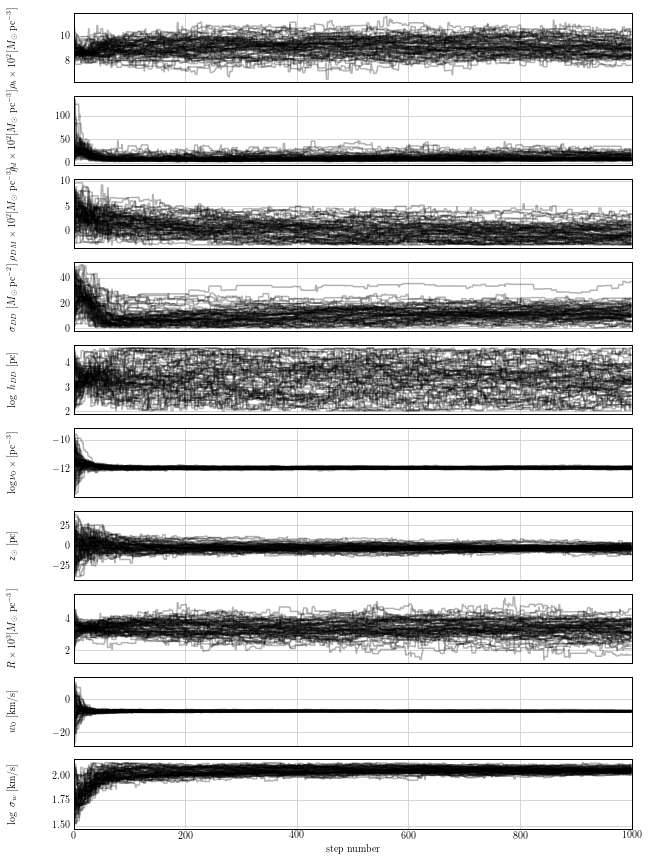

In [27]:
# from utils import consume_samples_dd_dm

sampler = run_mcmc(
    nwalkers, ndim, p0, dim, log_posterior_dd_dm, consume_samples_dd_dm, cores=cores,
    args=[data, locs, scales, dim, norm_list_DM, uni_list_DM, simple], 
    plot=True, step=1000, simple=simple
)

100%|██████████| 2000/2000 [05:13<00:00,  6.39it/s]


Multiprocessing took 313.6 seconds


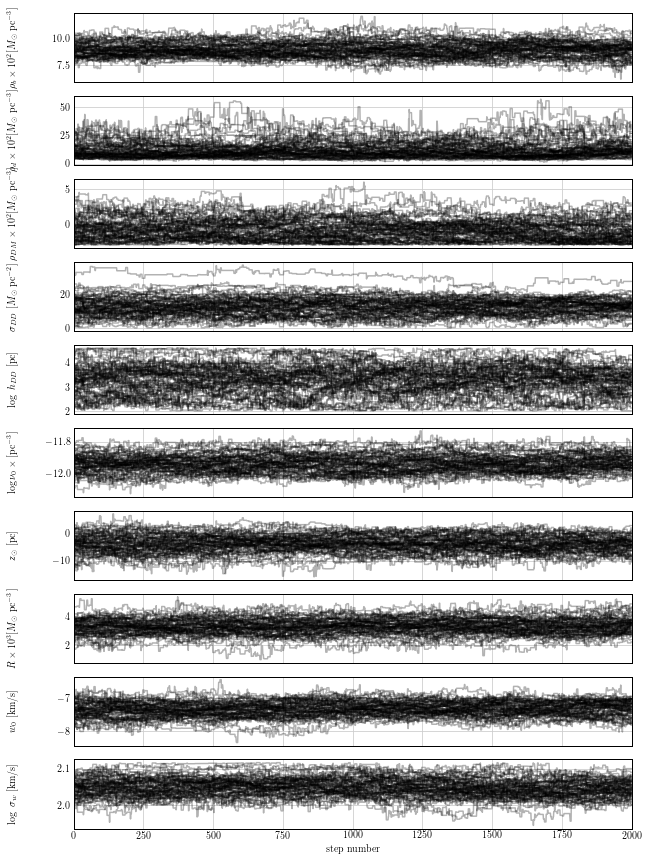

In [28]:
## run again, with the last sample as the initial point
next_p0 = sampler.get_chain()[-1]
sampler_new = run_mcmc(
    nwalkers, ndim, next_p0, dim, log_posterior_dd_dm, consume_samples_dd_dm, cores=cores,
    args=[data, locs, scales, dim, norm_list_DM, uni_list_DM, simple], 
    plot=True, step=2000, simple=simple
)

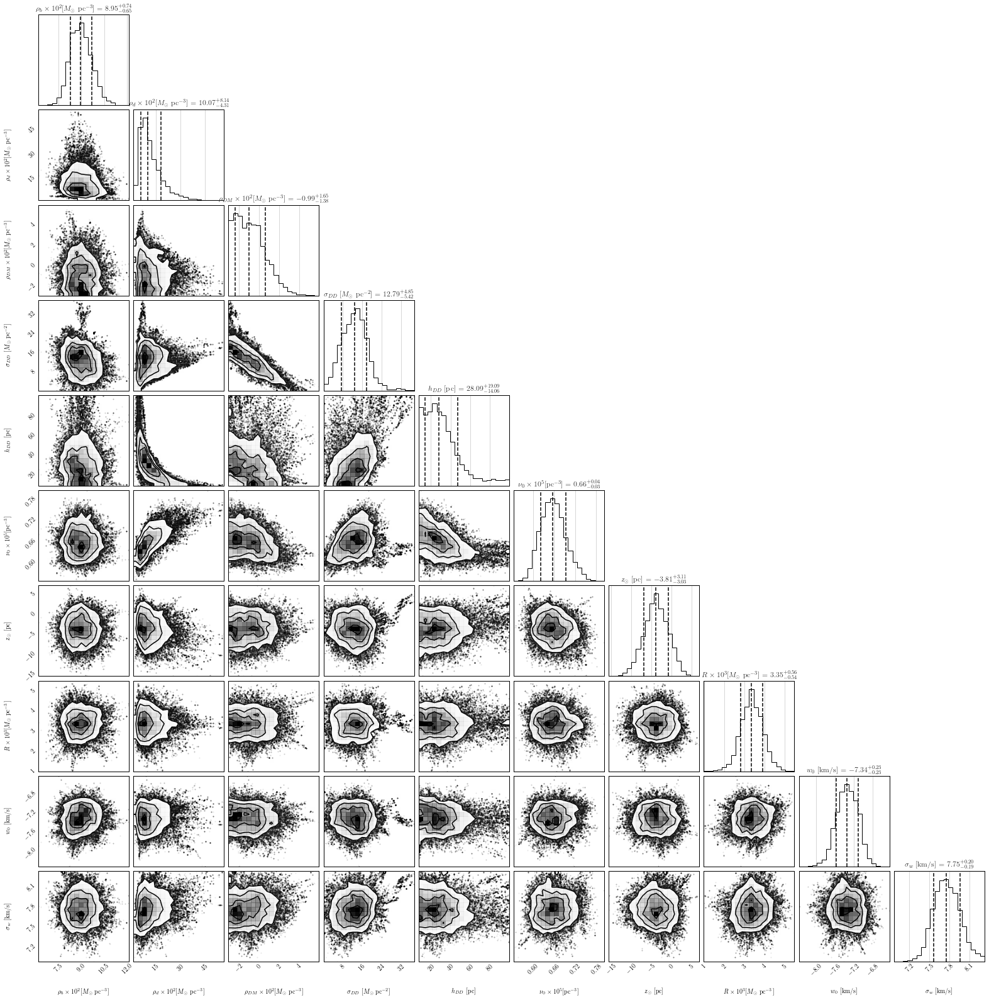

In [29]:
samples = sampler_new.get_chain()
plot_corner(samples, dim, consume_samples_dd_dm, simple=simple)

100%|██████████| 500/500 [00:12<00:00, 39.61it/s]


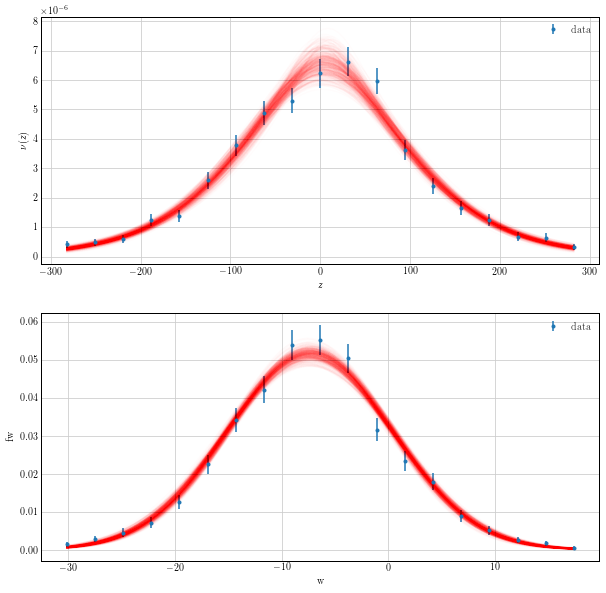

In [30]:
from utils import plot_fitting_dd_dm

plot_fitting_dd_dm(sampler_new, data, dim, alpha=0.01, n=500, simple=simple)

In [31]:
from utils import get_dataframe_dd_dm
df = get_dataframe_dd_dm(sampler_new, dim, locs, scales, norm_list_DM, uni_list_DM, nwalkers, simple=simple)
df

Time: 228.23 s


#,rhoDM,sigmaDD,log_hDD,log_nu0,zsun,R,log_prior,log_posterior,log_likelihood,w0_0,log_sigma_w_0,a_0,rhob_0,sigmaz_0,rhob_1,sigmaz_1,rhob_2,sigmaz_2,rhob_3,sigmaz_3,rhob_4,sigmaz_4,rhob_5,sigmaz_5,rhob_6,sigmaz_6,rhob_7,sigmaz_7,rhob_8,sigmaz_8,rhob_9,sigmaz_9,rhob_10,sigmaz_10,rhob_11,sigmaz_11,walker
0,-0.004576819254909853,10.903024291165469,3.3130585939568755,-11.933244642592303,-5.2572781542590175,0.003918330909209489,46.78207412796146,405.57719345645364,358.7951193284922,0.003918330909209489,-7.27691710467388,2.053547871998434,0.01086630815626359,4.053948403084135,0.030412875474485773,7.2531945389854435,0.006347302398423167,20.14527983335218,0.0005322521141928431,38.874563242255434,0.0005675547961488109,13.509473490765622,0.0016441769660485942,9.039814152801616,0.002092186628522695,11.312102435638899,0.0031346606251426096,20.013157895487478,0.007198196617729693,17.835185560296686,0.019385372463514062,21.798001823615692,0.005494874113373781,16.151290334349465,0.0021165100362762084,16.952120793963523,11
1,-0.004576819254909853,10.903024291165469,3.3130585939568755,-11.933244642592303,-5.2572781542590175,0.003918330909209489,46.78207412796146,405.57719345645364,358.7951193284922,0.003918330909209489,-7.27691710467388,2.053547871998434,0.01086630815626359,4.053948403084135,0.030412875474485773,7.2531945389854435,0.006347302398423167,20.14527983335218,0.0005322521141928431,38.874563242255434,0.0005675547961488109,13.509473490765622,0.0016441769660485942,9.039814152801616,0.002092186628522695,11.312102435638899,0.0031346606251426096,20.013157895487478,0.007198196617729693,17.835185560296686,0.019385372463514062,21.798001823615692,0.005494874113373781,16.151290334349465,0.0021165100362762084,16.952120793963523,11
2,-0.004576819254909853,10.903024291165469,3.3130585939568755,-11.933244642592303,-5.2572781542590175,0.003918330909209489,46.78207412796146,405.57719345645364,358.7951193284922,0.003918330909209489,-7.27691710467388,2.053547871998434,0.01086630815626359,4.053948403084135,0.030412875474485773,7.2531945389854435,0.006347302398423167,20.14527983335218,0.0005322521141928431,38.874563242255434,0.0005675547961488109,13.509473490765622,0.0016441769660485942,9.039814152801616,0.002092186628522695,11.312102435638899,0.0031346606251426096,20.013157895487478,0.007198196617729693,17.835185560296686,0.019385372463514062,21.798001823615692,0.005494874113373781,16.151290334349465,0.0021165100362762084,16.952120793963523,11
3,-0.004576819254909853,10.903024291165469,3.3130585939568755,-11.933244642592303,-5.2572781542590175,0.003918330909209489,46.78207412796146,405.57719345645364,358.7951193284922,0.003918330909209489,-7.27691710467388,2.053547871998434,0.01086630815626359,4.053948403084135,0.030412875474485773,7.2531945389854435,0.006347302398423167,20.14527983335218,0.0005322521141928431,38.874563242255434,0.0005675547961488109,13.509473490765622,0.0016441769660485942,9.039814152801616,0.002092186628522695,11.312102435638899,0.0031346606251426096,20.013157895487478,0.007198196617729693,17.835185560296686,0.019385372463514062,21.798001823615692,0.005494874113373781,16.151290334349465,0.0021165100362762084,16.952120793963523,11
4,-0.004576819254909853,10.903024291165469,3.3130585939568755,-11.933244642592303,-5.2572781542590175,0.003918330909209489,46.78207412796146,405.57719345645364,358.7951193284922,0.003918330909209489,-7.27691710467388,2.053547871998434,0.01086630815626359,4.053948403084135,0.030412875474485773,7.2531945389854435,0.006347302398423167,20.14527983335218,0.0005322521141928431,38.874563242255434,0.0005675547961488109,13.509473490765622,0.0016441769660485942,9.039814152801616,0.002092186628522695,11.312102435638899,0.0031346606251426096,20.013157895487478,0.007198196617729693,17.835185560296686,0.019385372463514062,21.798001823615692,0.005494874113373781,16.151290334349465,0.0021165100362762084,16.952120793963523,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,.